In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s /content/gdrive/My\ Drive/ /mydrive
%cd /mydrive/yolov9-main
#!ls

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
ln: failed to create symbolic link '/mydrive/My Drive': File exists
/content/gdrive/.shortcut-targets-by-id/1FsxtjdRhKCSS4b319zT5rcL3Dd5sOLs5/yolov9-main


In [ ]:
!pip install git+https://github.com/cocodataset/panopticapi.git

In [ ]:
!git clone https://github.com/facebookresearch/detectron2.git
%cd detectron2

fatal: destination path 'detectron2' already exists and is not an empty directory.
/content/gdrive/.shortcut-targets-by-id/1FsxtjdRhKCSS4b319zT5rcL3Dd5sOLs5/yolov9-main/detectron2


In [ ]:
# Install Detectron2 (specific version for compatibility)
#!pip install git+https://github.com/facebookresearch/detectron2.git@v0.6
!pip install -U 'git+https://github.com/facebookresearch/detectron2.git'

In [ ]:
import sys
import os
import yaml
import numpy as np
import torch

sys.path.insert(0, '/content/gdrive/MyDrive/yolov9-main/detectron2')

In [ ]:
import os
import detectron2
from PIL import Image
import re

# 1. Ensure Pillow is new enough
print(f"Pillow version: {Image.__version__}")
if not hasattr(Image, "Resampling"):
    raise RuntimeError("You must upgrade pillow >=10.1")

# 2. Locate detectron2 install
d2_dir = os.path.dirname(detectron2.__file__)
print("Detectron2 installed at:", d2_dir)

# 3. Target the file to patch
target = os.path.join(d2_dir, "data", "transforms", "transform.py")

# 4. Replace deprecated Pillow constants
with open(target, "r") as f:
    code = f.read()

patched = re.sub(r"Image\.LINEAR", "Image.Resampling.BILINEAR", code)

with open(target, "w") as f:
    f.write(patched)

print("✅ Patched:", target)

Pillow version: 11.3.0
Detectron2 installed at: /usr/local/lib/python3.12/dist-packages/detectron2
✅ Patched: /usr/local/lib/python3.12/dist-packages/detectron2/data/transforms/transform.py


In [ ]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import torch
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog
from detectron2.projects.deeplab import add_deeplab_config
from detectron2.projects.panoptic_deeplab import add_panoptic_deeplab_config
coco_metadata = MetadataCatalog.get("coco_2017_val_panoptic")

In [ ]:
cfg = get_cfg()
add_panoptic_deeplab_config(cfg)
cfg.merge_from_file("projects/Panoptic-DeepLab/configs/COCO-PanopticSegmentation/panoptic_deeplab_R_52_os16_mg124_poly_200k_bs64_crop_640_640_coco_dsconv.yaml")
cfg.MODEL.WEIGHTS = 'https://dl.fbaipublicfiles.com/detectron2/PanopticDeepLab/COCO-PanopticSegmentation/panoptic_deeplab_R_52_os16_mg124_poly_200k_bs64_crop_640_640_coco_dsconv/model_final_5e6da2.pkl'
predictor = DefaultPredictor(cfg)

[08/22 18:52:43 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/PanopticDeepLab/COCO-PanopticSegmentation/panoptic_deeplab_R_52_os16_mg124_poly_200k_bs64_crop_640_640_coco_dsconv/model_final_5e6da2.pkl ...


model_final_5e6da2.pkl: 122MB [00:01, 77.2MB/s]                           
  pixel_mean
  pixel_std


In [ ]:
from PIL import Image
import io
import os
import torch
import numpy
import numpy as np
import cv2
import random
import matplotlib.pyplot as plt

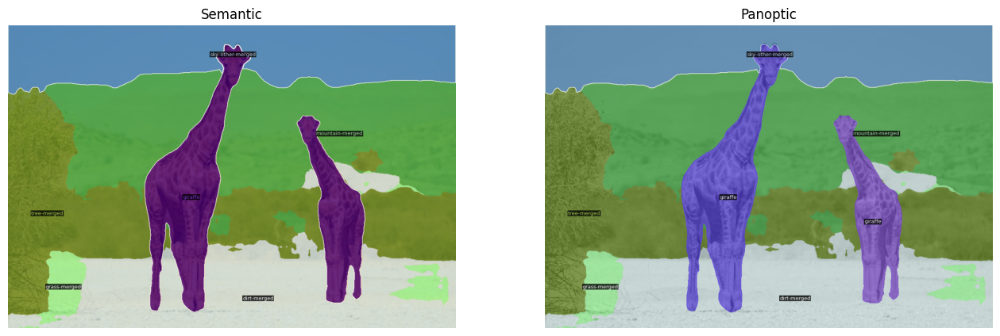

In [ ]:
im = cv2.imread("/content/gdrive/MyDrive/Hugging Face/datasets/vitpose_models/giraffe.jpg")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], coco_metadata, scale=1.2, instance_mode=ColorMode.IMAGE_BW)
panoptic_result = v.draw_panoptic_seg(outputs["panoptic_seg"][0].to("cpu"), outputs["panoptic_seg"][1]).get_image()
v = Visualizer(im[:, :, ::-1], coco_metadata, scale=1.2, instance_mode=ColorMode.IMAGE_BW)
semantic_result = v.draw_sem_seg(outputs["sem_seg"].argmax(0).to("cpu")).get_image()

# --- Display ---
plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.title('Semantic')
plt.axis('off')
plt.imshow(semantic_result)

plt.subplot(1, 2, 2)
plt.title('Panoptic')
plt.axis('off')
plt.imshow(panoptic_result)
plt.show()

With Panoptic-DeepLab_coco,

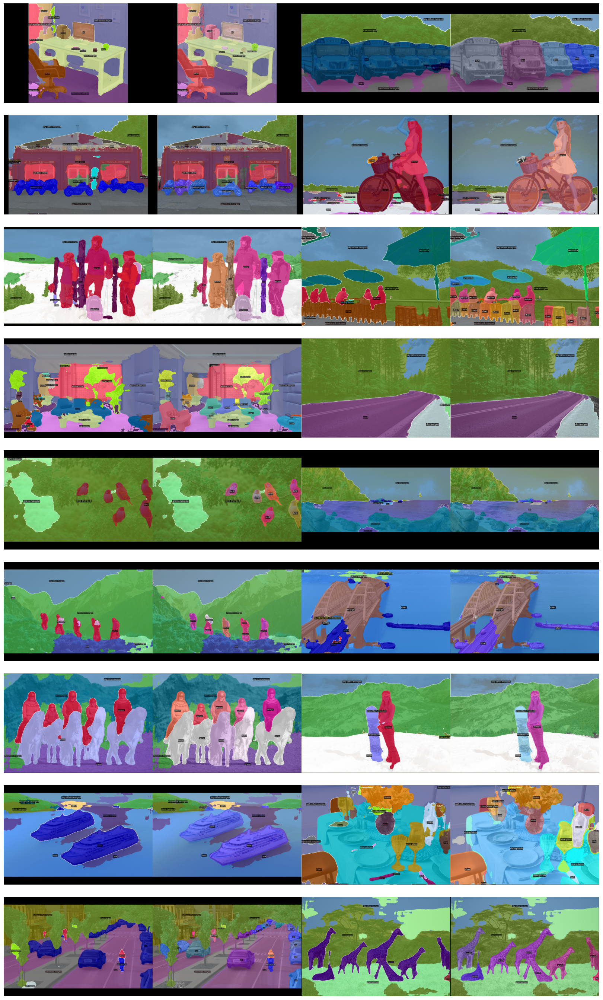

In [ ]:
val_dir = "/content/gdrive/MyDrive/Hugging Face/datasets/panoptic-tests"
num_samples = 18

# --------------------------
# Collect images
# --------------------------
all_imgs = [f for f in os.listdir(val_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
selected_imgs = random.sample(all_imgs, min(num_samples, len(all_imgs)))
img_paths = [os.path.join(val_dir, fname) for fname in selected_imgs]

processed_imgs = []
img_sizes = []

for image_path in img_paths:
    # Load image
    image_pil = Image.open(image_path).convert("RGB")
    image_np = np.array(image_pil) # Convert PIL Image to NumPy array

    outputs = predictor(image_np)
    v = Visualizer(image_np[:, :, ::-1], coco_metadata, scale=1.2, instance_mode=ColorMode.IMAGE_BW)
    panoptic_result = v.draw_panoptic_seg(outputs["panoptic_seg"][0].to("cpu"), outputs["panoptic_seg"][1]).get_image()
    v = Visualizer(image_np[:, :, ::-1], coco_metadata, scale=1.2, instance_mode=ColorMode.IMAGE_BW)
    semantic_result = v.draw_sem_seg(outputs["sem_seg"].argmax(0).to("cpu")).get_image()

    processed_imgs.append((semantic_result, panoptic_result))
    img_sizes.append(image_np.shape[:2])  # (height, width)

# --------------------------
# Prepare for grid plot
# --------------------------

cols = 4  # 2 images x 2 visuals = 4 subplots per row
rows = (len(processed_imgs) + 1) // 2  # 2 images per row

plt.figure(figsize=(4 * cols, 3 * rows))

# Target display size for each grid cell
target_height = 720
target_width = 1080

for idx, (img1, img2) in enumerate(processed_imgs):
    for view_idx, view in enumerate([img1, img2]):
        h, w = view.shape[:2]

        # Scale keeping aspect ratio
        scale = min(target_width / w, target_height / h)
        new_w, new_h = int(w * scale), int(h * scale)
        resized = cv2.resize(view, (new_w, new_h), interpolation=cv2.INTER_LINEAR)

        # Pad to target size
        top = (target_height - new_h) // 2
        bottom = target_height - new_h - top
        left = (target_width - new_w) // 2
        right = target_width - new_w - left
        padded = cv2.copyMakeBorder(resized, top, bottom, left, right,
                                    borderType=cv2.BORDER_CONSTANT, value=(0, 0, 0))

        plot_idx = idx * 2 + view_idx + 1
        plt.subplot(rows, cols, plot_idx)
        plt.imshow(padded)
        plt.axis('off')

plt.tight_layout(pad=0)           # removes padding around the whole figure
plt.subplots_adjust(wspace=0, hspace=0)  # removes spacing between cells
plt.show()

In [ ]:
cfg = get_cfg()
cfg.merge_from_file("configs/COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml")
cfg.MODEL.WEIGHTS = 'https://dl.fbaipublicfiles.com/detectron2/COCO-PanopticSegmentation/panoptic_fpn_R_101_3x/139514519/model_final_cafdb1.pkl'
predictor = DefaultPredictor(cfg)

[08/22 20:31:45 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-PanopticSegmentation/panoptic_fpn_R_101_3x/139514519/model_final_cafdb1.pkl ...


In [ ]:
coco_metadata = MetadataCatalog.get("coco_2017_val_panoptic_separated")

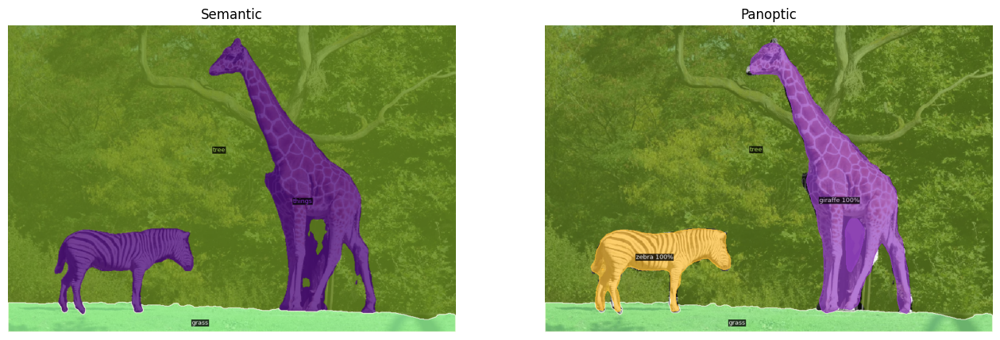

In [ ]:
im = cv2.imread("/content/gdrive/MyDrive/Hugging Face/datasets/vitpose_models/giraffe-zebra.jpg")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], coco_metadata, scale=1.2, instance_mode=ColorMode.IMAGE_BW)
panoptic_result = v.draw_panoptic_seg(outputs["panoptic_seg"][0].to("cpu"), outputs["panoptic_seg"][1]).get_image()
v = Visualizer(im[:, :, ::-1], coco_metadata, scale=1.2, instance_mode=ColorMode.IMAGE_BW)
semantic_result = v.draw_sem_seg(outputs["sem_seg"].argmax(0).to("cpu")).get_image()

# --- Display ---
plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.title('Semantic')
plt.axis('off')
plt.imshow(semantic_result)

plt.subplot(1, 2, 2)
plt.title('Panoptic')
plt.axis('off')
plt.imshow(panoptic_result)
plt.show()

With Panoptic-FPN_coco,

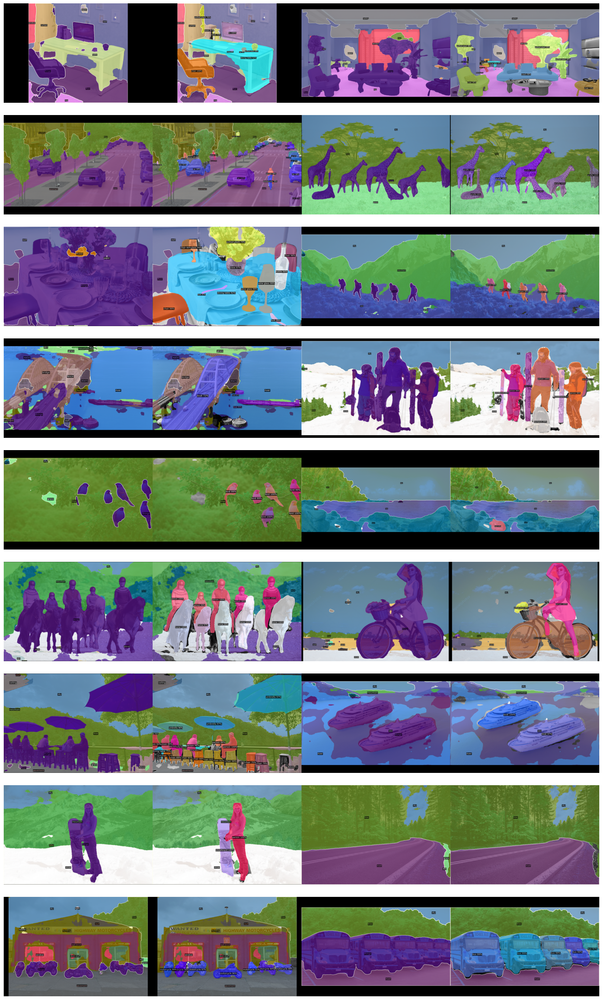

In [ ]:
val_dir = "/content/gdrive/MyDrive/Hugging Face/datasets/panoptic-tests"
num_samples = 18

# --------------------------
# Collect images
# --------------------------
all_imgs = [f for f in os.listdir(val_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
selected_imgs = random.sample(all_imgs, min(num_samples, len(all_imgs)))
img_paths = [os.path.join(val_dir, fname) for fname in selected_imgs]

processed_imgs = []
img_sizes = []

for image_path in img_paths:
    # Load image
    image_pil = Image.open(image_path).convert("RGB")
    image_np = np.array(image_pil) # Convert PIL Image to NumPy array

    outputs = predictor(image_np)
    v = Visualizer(image_np[:, :, ::-1], coco_metadata, scale=1.2, instance_mode=ColorMode.IMAGE_BW)
    panoptic_result = v.draw_panoptic_seg(outputs["panoptic_seg"][0].to("cpu"), outputs["panoptic_seg"][1]).get_image()
    v = Visualizer(image_np[:, :, ::-1], coco_metadata, scale=1.2, instance_mode=ColorMode.IMAGE_BW)
    semantic_result = v.draw_sem_seg(outputs["sem_seg"].argmax(0).to("cpu")).get_image()

    processed_imgs.append((semantic_result, panoptic_result))
    img_sizes.append(image_np.shape[:2])  # (height, width)

# --------------------------
# Prepare for grid plot
# --------------------------

cols = 4  # 2 images x 2 visuals = 4 subplots per row
rows = (len(processed_imgs) + 1) // 2  # 2 images per row

plt.figure(figsize=(4 * cols, 3 * rows))

# Target display size for each grid cell
target_height = 720
target_width = 1080

for idx, (img1, img2) in enumerate(processed_imgs):
    for view_idx, view in enumerate([img1, img2]):
        h, w = view.shape[:2]

        # Scale keeping aspect ratio
        scale = min(target_width / w, target_height / h)
        new_w, new_h = int(w * scale), int(h * scale)
        resized = cv2.resize(view, (new_w, new_h), interpolation=cv2.INTER_LINEAR)

        # Pad to target size
        top = (target_height - new_h) // 2
        bottom = target_height - new_h - top
        left = (target_width - new_w) // 2
        right = target_width - new_w - left
        padded = cv2.copyMakeBorder(resized, top, bottom, left, right,
                                    borderType=cv2.BORDER_CONSTANT, value=(0, 0, 0))

        plot_idx = idx * 2 + view_idx + 1
        plt.subplot(rows, cols, plot_idx)
        plt.imshow(padded)
        plt.axis('off')

plt.tight_layout(pad=0)           # removes padding around the whole figure
plt.subplots_adjust(wspace=0, hspace=0)  # removes spacing between cells
plt.show()